In [13]:
import cv2
import numpy as np
import cv2
import imutils
import numpy as np
import random
from matplotlib import pyplot as plt
from pdf2image import convert_from_path
import os
import tempfile
from pdf2image import convert_from_path
from PyPDF3 import PdfFileWriter, PdfFileReader
import glob
import cv2
import numpy as np
import PIL
from PIL import Image

In [17]:
path=r"D:\College\FinalYearCapstone\StandardResume\coordinates"
pdf_image_list = [_ for _ in os.listdir(path) if _.endswith(".jpg")]

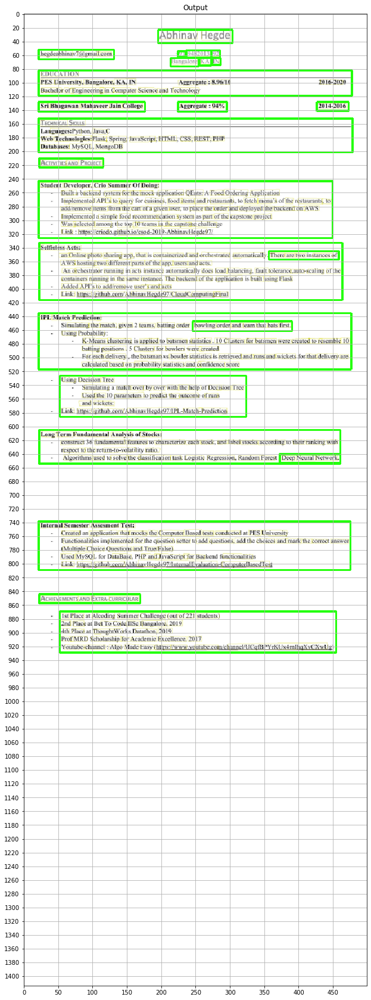

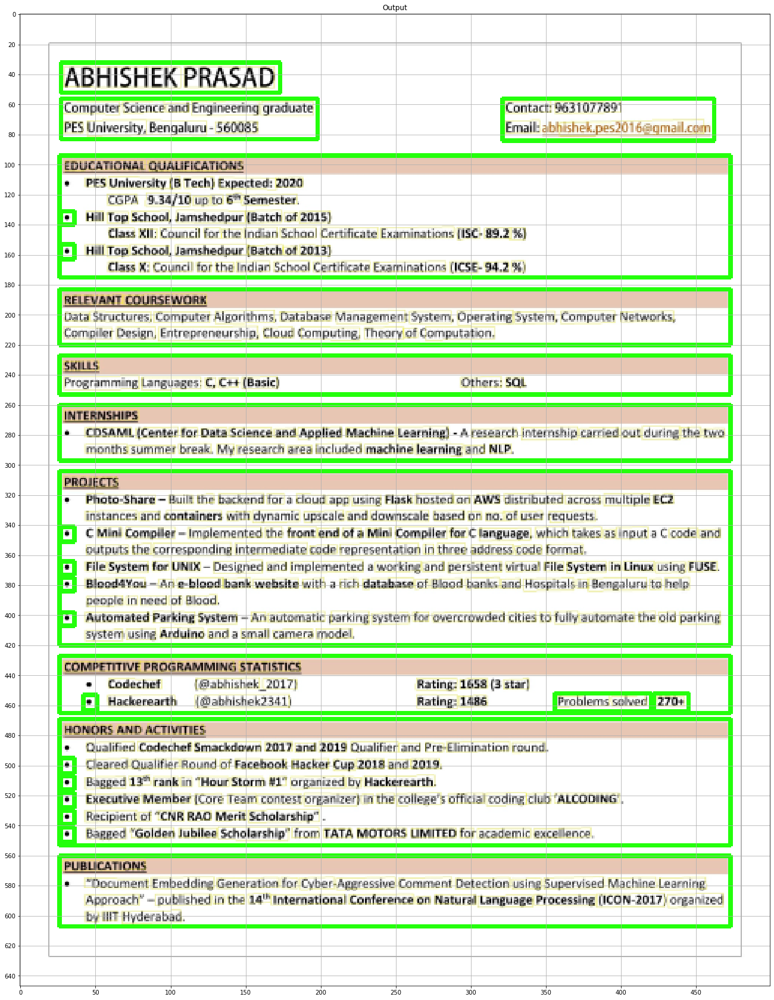

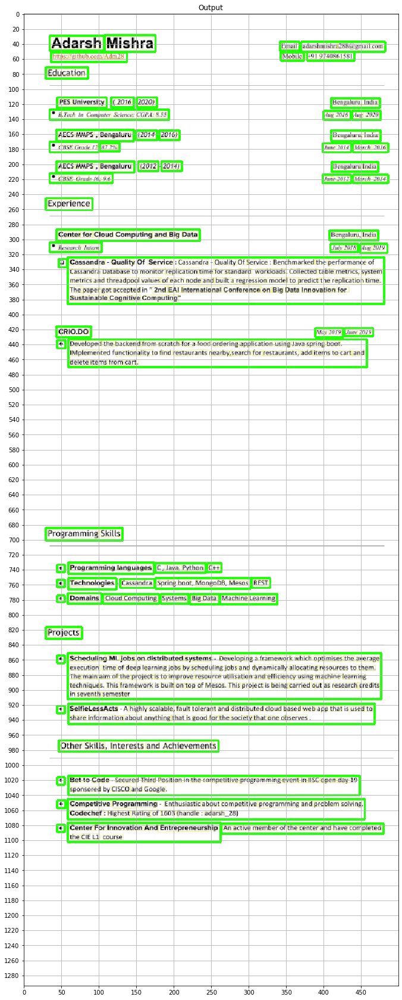

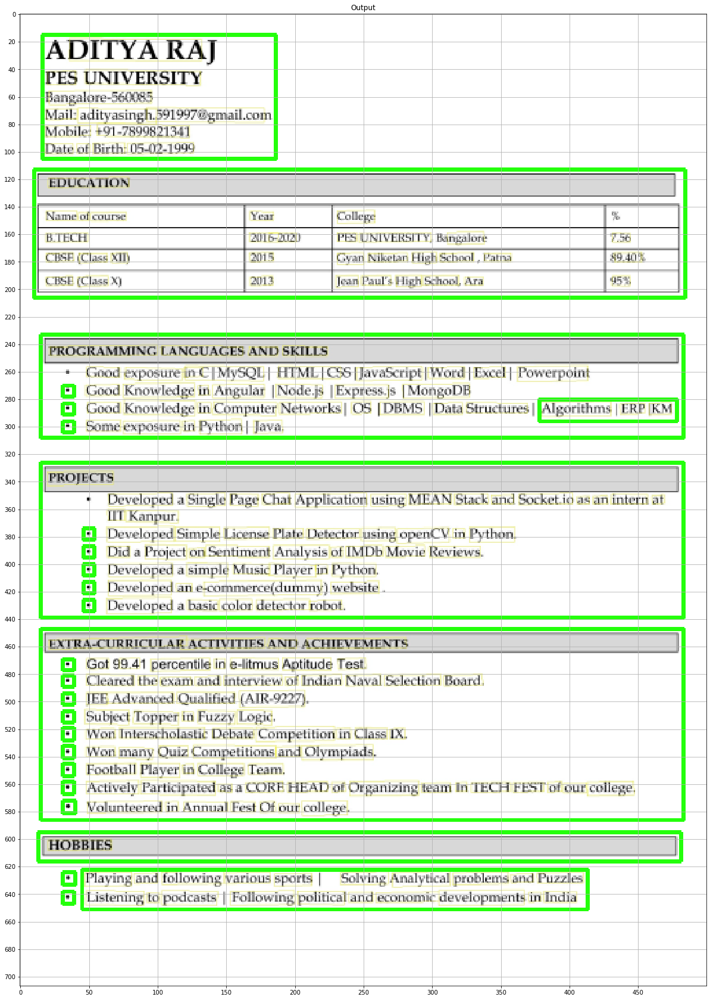

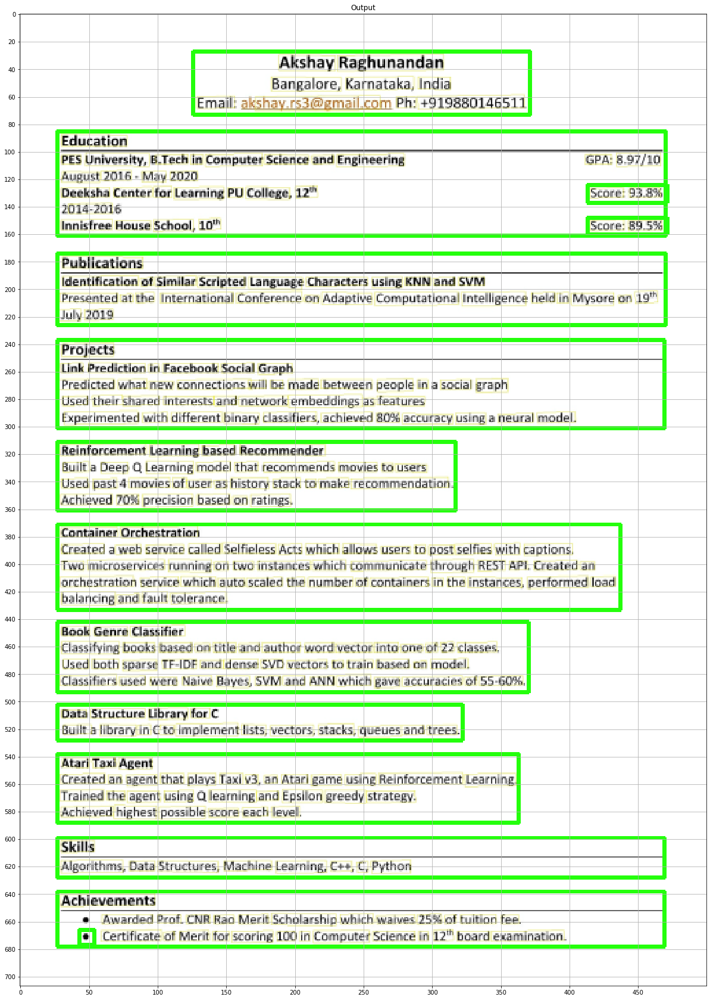

...

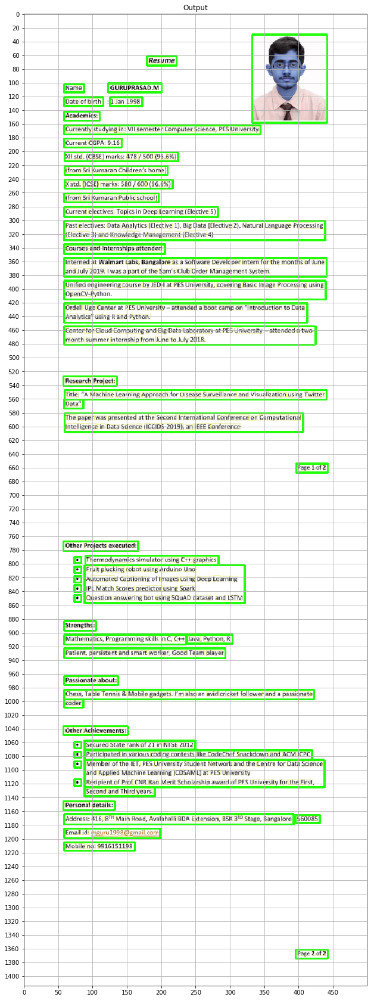

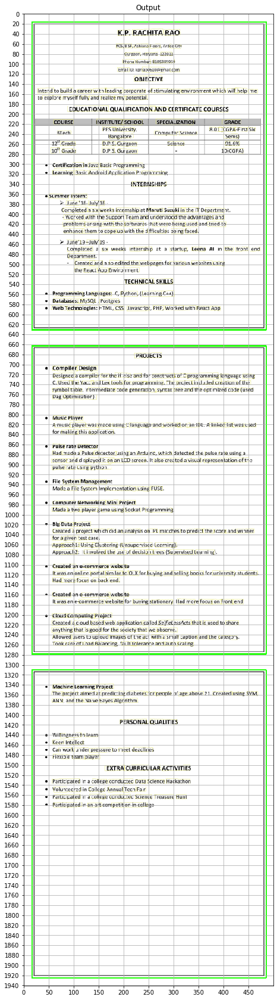

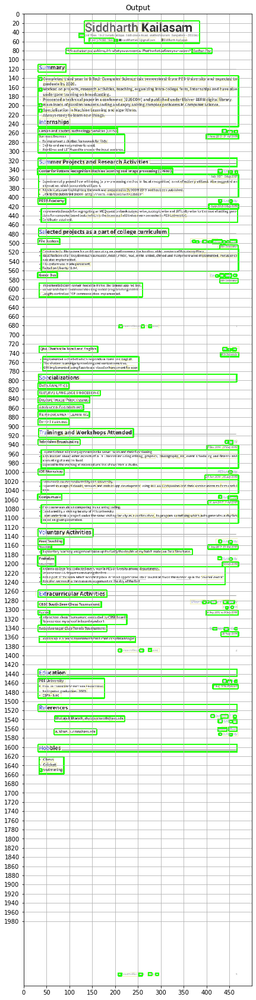

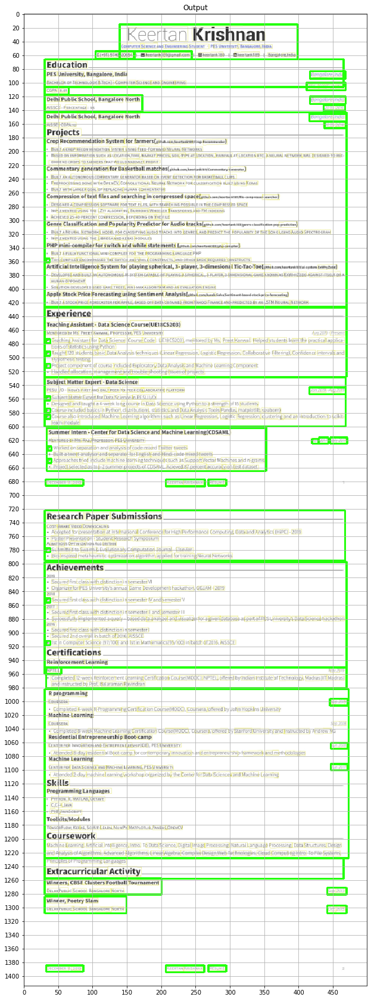

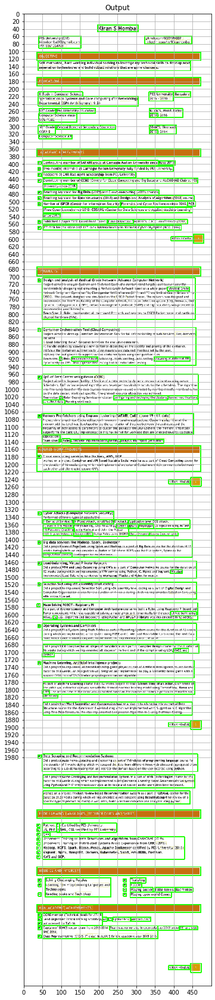

In [20]:
image_list = []
for pdf_image in pdf_image_list:
    pdf_image_name = path+'\\'+pdf_image
    image = cv2.imread(pdf_image_name)
    image = imutils.resize(image, width=500)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (7,7), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Create rectangular structuring element and dilate
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    dilate = cv2.dilate(thresh, kernel, iterations=1)

    # Find contours and draw rectangle
    cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2)

    #cv2.imshow('thresh', thresh)
    #cv2.imshow('dilate', dilate)
    #cv2.imshow('image', image)
    image_list.append(image)
    fig= plt.figure(figsize=(40,30))
    ax = fig.gca()
    ax.set_xticks(np.arange(0, 1800, 50))
    ax.set_yticks(np.arange(0, 2000, 20))
    plt.imshow(image)
    plt.title('Output')
    plt.grid()
    plt.show()
    #cv2.waitKey(0)

In [21]:
type(image_list[0])

numpy.ndarray

In [25]:
image_list1 = [Image.fromarray(i) for i in image_list]

In [26]:
imagelist = image_list1[1:]

In [27]:
image_list1[0].save(r'ResultsStandResumeImageProcessing.pdf',save_all=True, append_images=imagelist)